In [1]:
!pip install tensorflow

In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import re

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
music_info = "/content/drive/MyDrive/Music Info.csv"
user_listening_history = "/content/drive/MyDrive/User Listening History.csv"

music_info_df = pd.read_csv(music_info)
user_history_df = pd.read_csv(user_listening_history)

In [5]:
print('Original User Listening History shape:', user_history_df.shape)
print('Original Music Info shape:', music_info_df.shape)

Original User Listening History shape: (9711301, 3)
Original Music Info shape: (50683, 21)


## Exploratory Data Analysis

In [6]:
music_info_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50683 entries, 0 to 50682
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   track_id             50683 non-null  object 
 1   name                 50683 non-null  object 
 2   artist               50683 non-null  object 
 3   spotify_preview_url  50683 non-null  object 
 4   spotify_id           50683 non-null  object 
 5   tags                 49556 non-null  object 
 6   genre                22348 non-null  object 
 7   year                 50683 non-null  int64  
 8   duration_ms          50683 non-null  int64  
 9   danceability         50683 non-null  float64
 10  energy               50683 non-null  float64
 11  key                  50683 non-null  int64  
 12  loudness             50683 non-null  float64
 13  mode                 50683 non-null  int64  
 14  speechiness          50683 non-null  float64
 15  acousticness         50683 non-null 

In [7]:
user_history_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9711301 entries, 0 to 9711300
Data columns (total 3 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   track_id   object
 1   user_id    object
 2   playcount  int64 
dtypes: int64(1), object(2)
memory usage: 222.3+ MB


In [8]:
user_history_df.count()

,0
track_id,9711301
user_id,9711301
playcount,9711301


Mengambil sampel acak sebanyak 100.000 baris dari data riwayat mendengarkan pengguna (user_history_df) dan menyimpannya di variabel baru bernama user_history_df_reduced

In [9]:
user_history_df_reduced = user_history_df.sample(n=100000, random_state=42)

In [10]:
user_history_df_reduced.count()

,0
track_id,100000
user_id,100000
playcount,100000


In [11]:
print('\nUnique users:', user_history_df_reduced['user_id'].nunique())
print('Unique tracks listened:', user_history_df_reduced['track_id'].nunique())
print('Playcount statistics:\n', user_history_df_reduced['playcount'].describe())


Unique users: 87504
Unique tracks listened: 15333
Playcount statistics:
 count    100000.00000
mean          2.64694
std           7.33071
min           1.00000
25%           1.00000
50%           1.00000
75%           2.00000
max        1222.00000
Name: playcount, dtype: float64


Memfilter data user_history_df_reduced sehingga hanya menyisakan baris-baris di mana nilai playcount (jumlah putar) kurang dari atau sama dengan 6.

In [12]:
user_history_df_reduced = user_history_df_reduced[user_history_df_reduced['playcount'] <= 6]

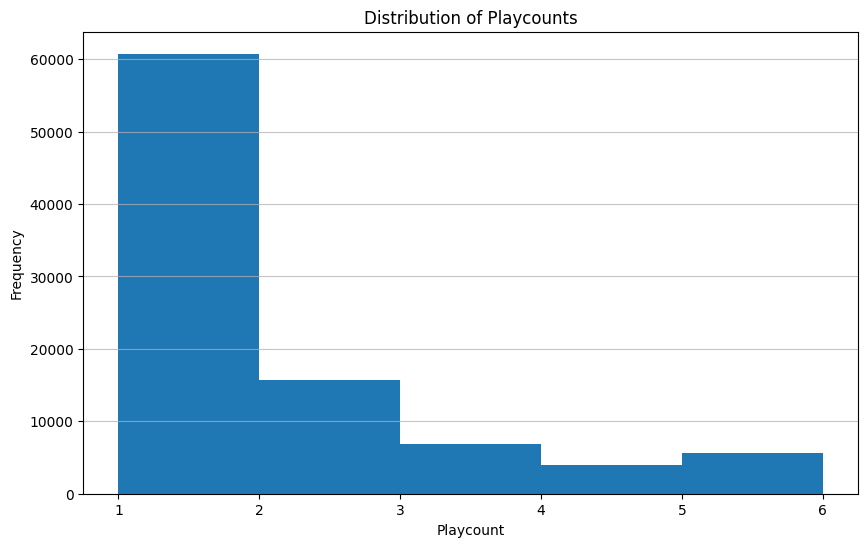

In [13]:
plt.figure(figsize=(10, 6))
user_history_df_reduced['playcount'].plot(kind='hist', bins=5, title='Distribution of Playcounts')
plt.xlabel('Playcount')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

Distribusi playcount yang condong ke kanan menunjukkan bahwa sebagian besar lagu memiliki jumlah pemutaran yang sangat rendah (1-2 kali). Pola ini mencerminkan perilaku konsumsi musik yang realistis di mana mayoritas interaksi pengguna adalah pemutaran tunggal atau beberapa kali putar, sementara hanya sebagian kecil lagu yang diputar berulang hingga 6 kali. Pemfilteran playcount <= 6 dalam rentang ini membantu mengurangi bias dari power users yang memutar lagu favorit mereka secara berlebihan dan memberikan gambaran yang lebih representatif tentang preferensi musik umum.

In [14]:
music_info_df.info()
print('\nUnique tracks:', music_info_df['track_id'].nunique())
print('Unique artists:', music_info_df['artist'].nunique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50683 entries, 0 to 50682
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   track_id             50683 non-null  object 
 1   name                 50683 non-null  object 
 2   artist               50683 non-null  object 
 3   spotify_preview_url  50683 non-null  object 
 4   spotify_id           50683 non-null  object 
 5   tags                 49556 non-null  object 
 6   genre                22348 non-null  object 
 7   year                 50683 non-null  int64  
 8   duration_ms          50683 non-null  int64  
 9   danceability         50683 non-null  float64
 10  energy               50683 non-null  float64
 11  key                  50683 non-null  int64  
 12  loudness             50683 non-null  float64
 13  mode                 50683 non-null  int64  
 14  speechiness          50683 non-null  float64
 15  acousticness         50683 non-null 

In [15]:
music_info_df.tags.head()

,tags
0,"rock, alternative, indie, alternative_rock, in..."
1,"rock, alternative, indie, pop, alternative_roc..."
2,"rock, alternative, alternative_rock, 90s, grunge"
3,"rock, alternative, indie, alternative_rock, in..."
4,"rock, alternative, indie, alternative_rock, in..."


Dua baris kode di bawah ini membersihkan kolom 'tags' pada music_info_df dengan mengambil tag pertama, kemudian menghapus karakter non-alfabet dan mengubahnya menjadi huruf kecil untuk membuat kolom 'tags_cleaned' yang mewakili genre.

In [16]:
# Clean and extract the first tag as genre
music_info_df['tags_cleaned'] = music_info_df['tags'].apply(lambda x: x.split(',')[0].strip() if pd.notna(x) and x.strip() else np.nan)
# Further clean the genre by removing any non-alphabetic characters
music_info_df['tags_cleaned'] = music_info_df['tags_cleaned'].apply(lambda x: re.sub(r'[^a-zA-Z\s]', '', str(x)).strip().lower() if pd.notna(x) else np.nan)

In [17]:
music_info_df.tags_cleaned

,tags_cleaned
0,rock
1,rock
2,rock
3,rock
4,rock
...,...
50678,NaN
50679,rock
50680,metal
50681,NaN


In [18]:
music_info_df.tags_cleaned.unique()

array(['rock', 'electronic', 'alternative', 'pop', 'indie',
       'alternativerock', 'punk', 'indierock', 'jazz', 'femalevocalists',
       'acoustic', 's', 'folk', 'metal', 'ambient', 'rap', 'emo', 'dance',
       'soul', 'piano', 'hardcore', 'experimental', 'punkrock', nan,
       'singersongwriter', 'postrock', 'metalcore', 'chillout',
       'psychedelic', 'heavymetal', 'reggae', 'indiepop',
       'progressiverock', 'funk', 'deathmetal', 'ska', 'malevocalists',
       'hiphop', 'british', 'instrumental', 'country', 'newwave',
       'beautiful', 'american', 'german', 'posthardcore', 'industrial',
       'classicrock', 'hardrock', 'blackmetal', 'classical', 'soundtrack',
       'blues', 'thrashmetal', 'japanese', 'progressivemetal', 'trance',
       'house', 'triphop', 'techno', 'postpunk', 'electro', 'rnb',
       'melodicdeathmetal', 'powermetal', 'downtempo', 'doommetal',
       'oldies', 'love', 'psychedelicrock', 'french', 'synthpop',
       'gothicmetal', 'russian', 'grunge'

In [19]:
# Removing NaN
music_info_df.dropna(subset=['tags_cleaned'], inplace=True)

In [20]:
music_info_df.tags_cleaned

,tags_cleaned
0,rock
1,rock
2,rock
3,rock
4,rock
...,...
50675,electronic
50677,alternativerock
50679,rock
50680,metal



Unique raw tags (first 20): ['rock' 'electronic' 'alternative' 'pop' 'indie' 'alternativerock' 'punk'
 'indierock' 'jazz' 'femalevocalists' 'acoustic' 's' 'folk' 'metal'
 'ambient' 'rap' 'emo' 'dance' 'soul' 'piano']


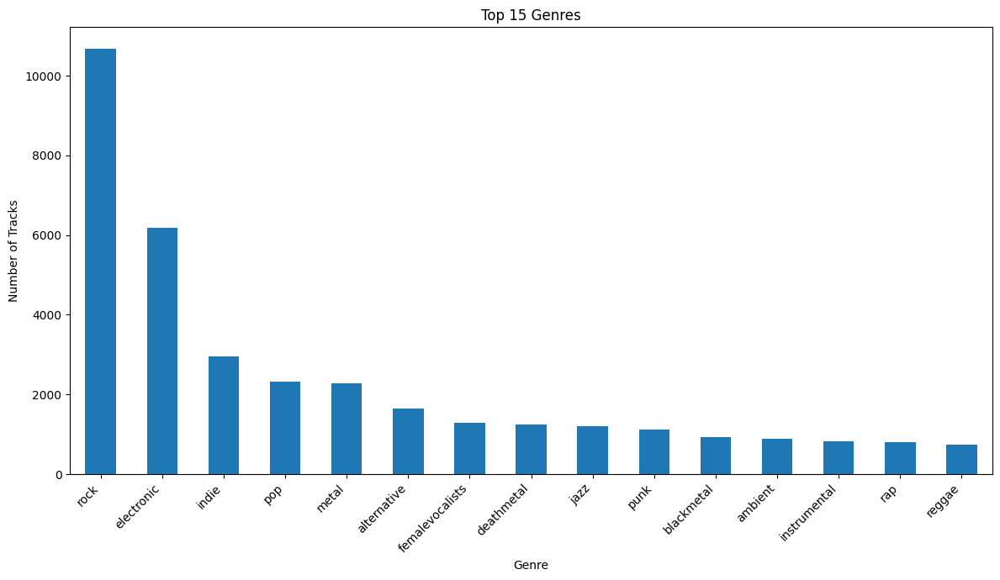

In [21]:
print('\nUnique raw tags (first 20):', music_info_df['tags_cleaned'].unique()[:20])

plt.figure(figsize=(12, 7))
music_info_df['tags_cleaned'].value_counts().head(15).plot(kind='bar', title='Top 15 Genres')
plt.xlabel('Genre')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Distribusi genre menunjukkan dominasi yang sangat jelas dari musik rock dengan lebih dari 10,000 track, diikuti oleh electronic (sekitar 6,200 track) dan indie (sekitar 3,000 track). Pola ini mencerminkan popularitas dan prevalensi genre rock dalam dataset, kemungkinan karena pengaruh historis genre tersebut dalam industri musik dan representasi yang kuat di platform streaming. Kesenjangan yang signifikan antara tiga genre teratas dengan genre lainnya menunjukkan konsentrasi konten yang tidak merata, di mana sebagian besar genre memiliki representasi yang relatif seimbang di kisaran 800-2,300 track.

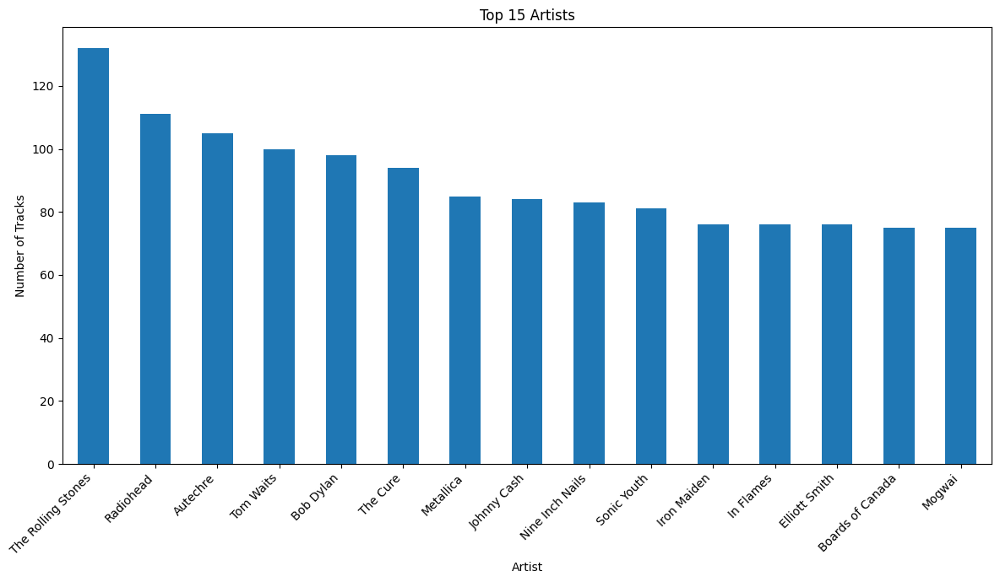

In [22]:
plt.figure(figsize=(12, 7))
music_info_df['artist'].value_counts().head(15).plot(kind='bar', title='Top 15 Artists')
plt.xlabel('Artist')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Distribusi artis menunjukkan bahwa The Rolling Stones mendominasi dataset dengan sekitar 130 track, diikuti oleh Radiohead (sekitar 110 track) dan Autechre (sekitar 105 track). Pola distribusi yang relatif merata di antara 15 artis teratas (rentang 75-130 track) menunjukkan tidak ada monopoli yang ekstrem seperti pada distribusi genre, dengan sebagian besar artis memiliki representasi yang cukup seimbang.

## Data Preparation

In [23]:
# Merge the datasets for collaborative filtering later
# We'll use a clean_music_df for content-based first.
# For collaborative filtering, we need user_id, track_id, and playcount.
df_cf = user_history_df_reduced.copy()
print(df_cf.shape)

(92879, 3)


In [24]:
df_cf

,track_id,user_id,playcount
2508064,TRNTNZL128F4259856,449bfa756a8e71f501aed4a84250aa1237f0040a,6
4671124,TRNBMJP128F93433D8,b218f76e5053c281ba233cf43845a285bfc3049f,1
3094899,TRDYGUV12903CDAF1E,533cbbc0be49822ce40f1d7fce2dc5db2dd377e1,1
134535,TRUSRFO128F147FC82,9c0e51864b053caeb212fefd0843de3af6a19283,1
125426,TRITUFI128F147B77A,57255430f4d62c72429c1b3808b64ac1bca08144,2
...,...,...,...
7839791,TRWTQCV128F1462B7F,cc334a02f994cfa2af38578861eee1c6216990ed,1
6256807,TRBGSFN128F9324F03,7d3d1999c97a547fbb459d04545bd316197a2c7d,1
6044993,TRQGHWL128EF33FB48,7bcddb67f19237b576a04ffba65bbb5436085f36,3
690735,TROHYKR128F9317025,d23e488ee6394438b8252b7421c417d9b83a6b05,1


Kode di bawah ini membuat dataset yang lebih bersih untuk content-based filtering dengan mengambil kolom penting ('track_id', 'name', 'artist', 'tags_cleaned') dan mengganti nama kolom 'tags_cleaned' menjadi 'genre' untuk konsistensi. Proses ini dilakukan untuk mempersiapkan data yang akan digunakan dalam sistem rekomendasi berbasis konten, dengan menampilkan dimensi dataset dan memeriksa adanya missing values untuk memastikan kualitas data.

In [25]:
clean_music_df = music_info_df[['track_id', 'name', 'artist', 'tags_cleaned']].copy()
clean_music_df.rename(columns={'tags_cleaned': 'genre'}, inplace=True)
print('\nClean Music Info for Content-Based Filtering shape:', clean_music_df.shape)
print('Missing values in clean_music_df:\n', clean_music_df.isnull().sum())


Clean Music Info for Content-Based Filtering shape: (49556, 4)
Missing values in clean_music_df:
 track_id    0
name        0
artist      0
genre       0
dtype: int64


In [26]:
clean_music_df.dropna(subset=['name', 'artist', 'genre'], inplace=True)
print('\nClean Music Info after dropping NaNs shape:', clean_music_df.shape)


Clean Music Info after dropping NaNs shape: (49556, 4)


In [27]:
clean_music_df = clean_music_df.drop_duplicates('track_id')
print('\nClean Music Info after dropping duplicate track_ids shape:', clean_music_df.shape)


Clean Music Info after dropping duplicate track_ids shape: (49556, 4)


In [28]:
# Convert track_id, name, artist and genre to lists
track_ids_cb = clean_music_df['track_id'].tolist()
track_names_cb = clean_music_df['name'].tolist()
track_artist_cb = clean_music_df['artist'].tolist()
track_genres_cb = clean_music_df['genre'].tolist()

In [29]:
print(f'Number of unique track IDs for CB: {len(track_ids_cb)}')
print(f'Number of unique track names for CB: {len(track_names_cb)}')
print(f'Number of unique track names for CB: {len(track_artist_cb)}')
print(f'Number of unique track genres for CB: {len(track_genres_cb)}')

Number of unique track IDs for CB: 49556
Number of unique track names for CB: 49556
Number of unique track names for CB: 49556
Number of unique track genres for CB: 49556


In [30]:
# Create a new DataFrame for content-based filtering with unique tracks
music_for_content_based = pd.DataFrame({
    'track_id': track_ids_cb,
    'track_name': track_names_cb,
    'artist': track_artist_cb,
    'genre': track_genres_cb
})
print('\nMusic for Content-Based Filtering DataFrame:\n', music_for_content_based.head())


Music for Content-Based Filtering DataFrame:
              track_id       track_name           artist genre
0  TRIOREW128F424EAF0   Mr. Brightside      The Killers  rock
1  TRRIVDJ128F429B0E8       Wonderwall            Oasis  rock
2  TROUVHL128F426C441  Come as You Are          Nirvana  rock
3  TRUEIND128F93038C4      Take Me Out  Franz Ferdinand  rock
4  TRLNZBD128F935E4D8            Creep        Radiohead  rock


In [31]:
data_cb = music_for_content_based
data_cb.sample(5)

,track_id,track_name,artist,genre
36860,TRPLKBK128F9302CA6,Osez Joséphine,Alain Bashung,french
23515,TRGERKE128F428AAEE,Daddy's Little Defect,Sugarcult,rock
5058,TRESXCR128F932A9F1,Cartoons and Macramé Wounds,Mew,alternative
41754,TRJSKOK12903CABAA4,Easter Song,A Man Called Adam,ambient
47023,TRUJSZN128F427201C,Master-Dik,Sonic Youth,alternative


### TF-IDF Vectorizer

In [32]:
tfidf_vectorizer = TfidfVectorizer()

Kode ini melatih TF-IDF (Term Frequency-Inverse Document Frequency) vectorizer pada kolom 'genre' dari dataset content-based filtering untuk mengkonversi teks genre menjadi representasi numerik.

In [33]:
tfidf_vectorizer.fit(data_cb['genre'])

TfidfVectorizer()

In [34]:
print('\nTF-IDF Features:\n', tfidf_vectorizer.get_feature_names_out())


TF-IDF Features:
 ['acoustic' 'alternative' 'alternativerock' 'ambient' 'american'
 'avantgarde' 'beautiful' 'blackmetal' 'blues' 'bluesrock' 'british'
 'britpop' 'chill' 'chillout' 'classical' 'classicrock' 'country' 'cover'
 'dance' 'darkambient' 'deathmetal' 'doommetal' 'downtempo' 'drumandbass'
 'electro' 'electronic' 'emo' 'experimental' 'femalevocalists' 'folk'
 'french' 'funk' 'german' 'gothic' 'gothicmetal' 'grindcore' 'grunge'
 'guitar' 'hardcore' 'hardrock' 'heavymetal' 'hiphop' 'house' 'idm'
 'indie' 'indiepop' 'indierock' 'industrial' 'instrumental' 'japanese'
 'jazz' 'jpop' 'lounge' 'love' 'malevocalists' 'mellow'
 'melodicdeathmetal' 'metal' 'metalcore' 'newage' 'newwave' 'noise'
 'numetal' 'oldies' 'piano' 'polish' 'pop' 'poprock' 'posthardcore'
 'postpunk' 'postrock' 'powermetal' 'progressivemetal' 'progressiverock'
 'psychedelic' 'psychedelicrock' 'punk' 'punkrock' 'rap' 'reggae' 'rnb'
 'rock' 'russian' 'screamo' 'singersongwriter' 'ska' 'soul' 'soundtrack'
 'swedish'

In [35]:
tfidf_matrix = tfidf_vectorizer.fit_transform(data_cb['genre'])
print('\nTF-IDF Matrix Shape:', tfidf_matrix.shape)


TF-IDF Matrix Shape: (49556, 95)


In [36]:
# Vector tf-idf to matrix
tfidf_matrix.todense()

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [37]:
pd.DataFrame(
    tfidf_matrix.todense(),
    columns=tfidf_vectorizer.get_feature_names_out(),
    index=data_cb.track_name
).sample(10, axis=1).sample(10, axis=0)

,electronic,heavymetal,soul,country,singersongwriter,blackmetal,triphop,polish,pop,doommetal
track_name,,,,,,,,,,
Element,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
What's The Matter?,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
This Is Goodbye,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
From Now On,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Strange Fruit,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"Mercy, Mercy",0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Whirling Hall of Knives,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Elle S'en Va,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
My Revenge on the World,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Model Development with Content Based Filtering

### Cosine Similarity

KMenghitung cosine similarity matrix dari TF-IDF matrix untuk mengukur kemiripan antar lagu berdasarkan genre, menghasilkan matriks simetrik berukuran n x n (dimana n adalah jumlah lagu). Matrix cosine similarity ini menjadi dasar untuk sistem rekomendasi content-based filtering, di mana nilai similarity yang tinggi (mendekati 1) menunjukkan dua lagu memiliki genre yang sangat mirip dan dapat direkomendasikan satu sama lain.

In [38]:
# Calculate cosine similarity on matrix tf-idf
cosine_sim = cosine_similarity(tfidf_matrix)
print('\nCosine Similarity Matrix Shape:', cosine_sim.shape)


Cosine Similarity Matrix Shape: (49556, 49556)


In [39]:
# Create a dataframe from the cosine_sim variable with rows and columns of track names
cosine_sim_df = pd.DataFrame(cosine_sim, index=data_cb['track_name'], columns=data_cb['track_name'])
print('Cosine Similarity DataFrame Shape:', cosine_sim_df.shape)

Cosine Similarity DataFrame Shape: (49556, 49556)


In [40]:
print('\nSample of Cosine Similarity Matrix:\n', cosine_sim_df.sample(5, axis=1).sample(10, axis=0))


Sample of Cosine Similarity Matrix:
 track_name                In Existence  The Worlds In Me  Home Zone  \
track_name                                                            
Kingdom for a Heart                0.0               0.0        0.0   
Fatal Beating                      0.0               0.0        1.0   
The Eternal                        0.0               0.0        0.0   
No Sweat                           0.0               0.0        1.0   
Crutch Field Tongs                 0.0               0.0        0.0   
Lightning Strikes Twice            0.0               0.0        0.0   
Kingston Town                      0.0               0.0        0.0   
Thank God It's Christmas           0.0               0.0        0.0   
Faraway Swimmingpool               0.0               0.0        1.0   
Hallelujah (club mix)              0.0               0.0        0.0   

track_name                Beginnings  Judas Touch  
track_name                                         
Kingd

### Recommendation (Content Based)

In [41]:
def music_recommendations(song_name, similarity_data=cosine_sim_df, items=data_cb[['track_name', 'artist', 'genre']], k=5):

    if song_name not in similarity_data.columns:
        print(f"Song '{song_name}' not found in the similarity data.")
        return pd.DataFrame()

    # Retrieve data using argpartition to indirectly partition along the given axis
    # The DataFrame is converted to a numpy array
    # Range(start, stop, step)
    index = similarity_data.loc[:,song_name].to_numpy().argpartition(
        range(-1, -k, -1))

    # Get data with the greatest similarity from the existing index
    closest = similarity_data.columns[index[-1:-(k+2):-1]]

    # Drop the song name so the searched song doesn't appear in the recommendation list
    closest = closest.drop(song_name, errors='ignore')

    return pd.DataFrame(closest).merge(items).head(k)

In [42]:
music_info_df

,track_id,name,artist,spotify_preview_url,spotify_id,tags,genre,year,duration_ms,danceability,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,tags_cleaned
0,TRIOREW128F424EAF0,Mr. Brightside,The Killers,https://p.scdn.co/mp3-preview/4d26180e6961fd46...,09ZQ5TmUG8TSL56n0knqrj,"rock, alternative, indie, alternative_rock, in...",NaN,2004,222200,0.355,...,-4.360,1,0.0746,0.001190,0.000000,0.0971,0.240,148.114,4,rock
1,TRRIVDJ128F429B0E8,Wonderwall,Oasis,https://p.scdn.co/mp3-preview/d012e536916c927b...,06UfBBDISthj1ZJAtX4xjj,"rock, alternative, indie, pop, alternative_roc...",NaN,2006,258613,0.409,...,-4.373,1,0.0336,0.000807,0.000000,0.2070,0.651,174.426,4,rock
2,TROUVHL128F426C441,Come as You Are,Nirvana,https://p.scdn.co/mp3-preview/a1c11bb1cb231031...,0keNu0t0tqsWtExGM3nT1D,"rock, alternative, alternative_rock, 90s, grunge",RnB,1991,218920,0.508,...,-5.783,0,0.0400,0.000175,0.000459,0.0878,0.543,120.012,4,rock
3,TRUEIND128F93038C4,Take Me Out,Franz Ferdinand,https://p.scdn.co/mp3-preview/399c401370438be4...,0ancVQ9wEcHVd0RrGICTE4,"rock, alternative, indie, alternative_rock, in...",NaN,2004,237026,0.279,...,-8.851,1,0.0371,0.000389,0.000655,0.1330,0.490,104.560,4,rock
4,TRLNZBD128F935E4D8,Creep,Radiohead,https://p.scdn.co/mp3-preview/e7eb60e9466bc3a2...,01QoK9DA7VTeTSE3MNzp4I,"rock, alternative, indie, alternative_rock, in...",RnB,2008,238640,0.515,...,-9.935,1,0.0369,0.010200,0.000141,0.1290,0.104,91.841,4,rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50675,TRXWSIN128F9339A11,Infinite Love Song,Maximilian Hecker,https://p.scdn.co/mp3-preview/8b3d529025fe3c60...,2eIVm8hPf59hUS2PrdoGBa,"electronic, indie_pop, love",NaN,2002,285800,0.549,...,-7.431,1,0.0332,0.129000,0.437000,0.1220,0.551,99.679,4,electronic
50677,TRPIGDW12903CDEB2D,Slip of the Lip,Fact,https://p.scdn.co/mp3-preview/cf64490291f9a600...,0PG7cpyNzRehf1YNIbAsol,"alternative_rock, punk_rock",Rock,2010,183640,0.423,...,-4.068,1,0.1840,0.000986,0.000002,0.3790,0.224,100.080,4,alternativerock
50679,TRHQCSH128F42724B7,Colors Of The Wind,ACIDMAN,https://p.scdn.co/mp3-preview/8e22a7052ef3ecf7...,3wkdfXGf5JYErW4b35zP2h,"rock, alternative_rock, japanese, cover",NaN,2004,275133,0.351,...,-6.811,1,0.1200,0.000940,0.000049,0.1920,0.450,200.350,4,rock
50680,TRZRODK128F92D68D7,The Revelation,coldrain,https://p.scdn.co/mp3-preview/4b51a813f67e3853...,1gXMORZRGA40PE9rDE9cja,"metal, metalcore, post_hardcore",NaN,2014,254826,0.434,...,-3.092,0,0.2680,0.000108,0.001410,0.1630,0.282,158.025,4,metal


### Get Recommendation

In [43]:
music_recommendations('The Revelation')

,track_name,artist,genre
0,All I Had (I Gave),Crowbar,metal
1,Peace Sells,Megadeth,metal
2,Spieluhr,Rammstein,metal
3,Cyanide,Metallica,metal
4,The End of the Line,Metallica,metal


In [44]:
music_recommendations('Wonderwall')

,track_name,artist,genre
0,Hide & Seek,9mm Parabellum Bullet,rock
1,Sun Ra,dEUS,rock
2,In a Moment,Stereophonics,rock
3,Closer (Further Away),Nine Inch Nails,rock
4,God Damn the Sun,Swans,rock


Hasil ini menunjukkan bahwa sistem rekomendasi content-based filtering berfungsi dengan baik, di mana untuk lagu "The Revelation" sistem merekomendasikan 5 lagu metal (Crowbar, Megadeth, Rammstein, Metallica), dan untuk lagu "Wonderwall" sistem merekomendasikan 5 lagu rock (9mm Parabellum Bullet, dEUS, Stereophonics, Nine Inch Nails, Swans). Konsistensi genre dalam setiap rekomendasi membuktikan bahwa algoritma cosine similarity berhasil mengidentifikasi kemiripan berdasarkan fitur genre, memberikan rekomendasi yang relevan untuk pengguna yang menyukai lagu dengan karakteristik musik serupa.

### Evaluation

In [ ]:
# Sample a smaller number of tracks to evaluate coverage
sample_size = 1000 
sampled_tracks_for_coverage = data_cb['track_name'].sample(n=sample_size, random_state=42).tolist()

recommended_unique_tracks = set()

print(f"Calculating coverage based on a sample of {len(sampled_tracks_for_coverage)} tracks...")
for i, track_name in enumerate(sampled_tracks_for_coverage):
    if (i + 1) % 100 == 0:
        print(f"  Processed {i + 1}/{len(sampled_tracks_for_coverage)} tracks...")

    try:
        recs_df = music_recommendations(track_name, k=10) # Get top 10 recommendations
        recommended_unique_tracks.update(recs_df['track_name'].tolist())
    except Exception as e:
        pass

total_unique_tracks_in_dataset = len(data_cb['track_name'].unique())
coverage = len(recommended_unique_tracks) / total_unique_tracks_in_dataset

print(f"\nTotal unique tracks in dataset: {total_unique_tracks_in_dataset}")
print(f"Number of unique tracks recommended (from sample): {len(recommended_unique_tracks)}")
print(f"Content-Based System Coverage (Estimated): {coverage:.2%}")

Calculating coverage based on a sample of 1000 tracks...
  Processed 100/1000 tracks...
  Processed 200/1000 tracks...
  Processed 300/1000 tracks...
  Processed 400/1000 tracks...
  Processed 500/1000 tracks...
  Processed 600/1000 tracks...
  Processed 700/1000 tracks...
  Processed 800/1000 tracks...
  Processed 900/1000 tracks...
  Processed 1000/1000 tracks...

Total unique tracks in dataset: 49556
Number of unique tracks recommended (from sample): 770
Content-Based System Coverage (Estimated): 1.55%


## Model Development with Collaborative Filtering

Kode ini menggabungkan dataset user history yang telah dikurangi dengan informasi musik (track_name, artist, genre) berdasarkan track_id untuk membuat dataset lengkap yang diperlukan untuk collaborative filtering. Proses merge dengan inner join memastikan hanya data yang memiliki informasi lengkap (baik user interaction maupun metadata musik) yang dipertahankan, sehingga dataset siap digunakan untuk analisis preferensi pengguna dan pembuatan sistem rekomendasi berbasis kolaboratif.

In [45]:
df_cf = pd.merge(user_history_df_reduced, music_for_content_based[['track_id', 'track_name', 'artist', 'genre']], on='track_id', how='inner')

In [46]:
df_cf

,track_id,user_id,playcount,track_name,artist,genre
0,TRNTNZL128F4259856,449bfa756a8e71f501aed4a84250aa1237f0040a,6,Warriors Of Time,Black Tide,metal
1,TRNBMJP128F93433D8,b218f76e5053c281ba233cf43845a285bfc3049f,1,Kilometros,Sin Bandera,classical
2,TRDYGUV12903CDAF1E,533cbbc0be49822ce40f1d7fce2dc5db2dd377e1,1,A Mutiny,Red Sparowes,experimental
3,TRUSRFO128F147FC82,9c0e51864b053caeb212fefd0843de3af6a19283,1,That's Just the Way It Is,Phil Collins,rock
4,TRITUFI128F147B77A,57255430f4d62c72429c1b3808b64ac1bca08144,2,Another Town,Regina Spektor,femalevocalists
...,...,...,...,...,...,...
92168,TRWTQCV128F1462B7F,cc334a02f994cfa2af38578861eee1c6216990ed,1,The Melting Point Of Wax,Thrice,rock
92169,TRBGSFN128F9324F03,7d3d1999c97a547fbb459d04545bd316197a2c7d,1,Love Letter to Japan,The Bird and the Bee,electronic
92170,TRQGHWL128EF33FB48,7bcddb67f19237b576a04ffba65bbb5436085f36,3,Get Innocuous!,LCD Soundsystem,electronic
92171,TROHYKR128F9317025,d23e488ee6394438b8252b7421c417d9b83a6b05,1,The Fear,Lily Allen,pop


In [ ]:
# Encoding user
user_ids = df_cf['user_id'].unique().tolist()
print('list userID: ', user_ids)

user_to_user_encoded = {x: i for i, x in enumerate(user_ids)}
print('encoded userID : ', user_to_user_encoded)

user_encoded_to_user = {i: x for i, x in enumerate(user_ids)}
print('encoded angka ke userID: ', user_encoded_to_user)

list userID:  ['449bfa756a8e71f501aed4a84250aa1237f0040a', 'b218f76e5053c281ba233cf43845a285bfc3049f', '533cbbc0be49822ce40f1d7fce2dc5db2dd377e1', '9c0e51864b053caeb212fefd0843de3af6a19283', '57255430f4d62c72429c1b3808b64ac1bca08144', '41d133cf41b0c73f3023a3173ecdaf9540943e30', '7b33d9566abf9134d3815f768ed163ddf3172bbd', 'c02d632a9f92499b028f32744b0de643eae11a57', 'e06a53ce6caadf8447bb3b0d33319f6f30b73c45', 'ae9b78d3773aae5fb09d62fec684bfbeaff6c2f2', 'ffe7c95408a67ae7527b170268b3cf27df610b39', '9577daa40d6aaeda4730566becbe168b28be8cd7', '38c9d0bb8a9c67d3616a7dcebdce7309f87488b1', 'a429b7b2de02ffbe1ebf881cd3f24e75ff29af39', 'c118e6eb50a48a901bf4b0f8662e157404973973', '271f20c56a9e33f946352d3d08277b8e26b089a7', '697d0f2ed9b065bf795ef1ca8749bc2e298e0d86', '263689e30a6d379ecde5df23215268df6d366066', '2456484d873956c1e9c578960cfdd51243b0bf5b', 'cac04576d28ba1ccb8c4295f660606f0707d01e0', 'ce30be0944addfe301a54ae150378b420c08395f', '2eb2b812a4c34e0cb7a99c6db9990a4ea3dda6b1', '65e8790ae6da2062

In [ ]:
# Encoding track
track_ids = df_cf['track_id'].unique().tolist()

track_to_track_encoded = {x: i for i, x in enumerate(track_ids)}

track_encoded_to_track = {i: x for i, x in enumerate(track_ids)}

In [ ]:
# Mapping to user
df_cf['user'] = df_cf['user_id'].map(user_to_user_encoded)

# Mapping to track
df_cf['track'] = df_cf['track_id'].map(track_to_track_encoded)

In [50]:
df_cf

,track_id,user_id,playcount,track_name,artist,genre,user,track
0,TRNTNZL128F4259856,449bfa756a8e71f501aed4a84250aa1237f0040a,6,Warriors Of Time,Black Tide,metal,0,0
1,TRNBMJP128F93433D8,b218f76e5053c281ba233cf43845a285bfc3049f,1,Kilometros,Sin Bandera,classical,1,1
2,TRDYGUV12903CDAF1E,533cbbc0be49822ce40f1d7fce2dc5db2dd377e1,1,A Mutiny,Red Sparowes,experimental,2,2
3,TRUSRFO128F147FC82,9c0e51864b053caeb212fefd0843de3af6a19283,1,That's Just the Way It Is,Phil Collins,rock,3,3
4,TRITUFI128F147B77A,57255430f4d62c72429c1b3808b64ac1bca08144,2,Another Town,Regina Spektor,femalevocalists,4,4
...,...,...,...,...,...,...,...,...
92168,TRWTQCV128F1462B7F,cc334a02f994cfa2af38578861eee1c6216990ed,1,The Melting Point Of Wax,Thrice,rock,80951,1458
92169,TRBGSFN128F9324F03,7d3d1999c97a547fbb459d04545bd316197a2c7d,1,Love Letter to Japan,The Bird and the Bee,electronic,80952,2921
92170,TRQGHWL128EF33FB48,7bcddb67f19237b576a04ffba65bbb5436085f36,3,Get Innocuous!,LCD Soundsystem,electronic,80953,1559
92171,TROHYKR128F9317025,d23e488ee6394438b8252b7421c417d9b83a6b05,1,The Fear,Lily Allen,pop,80954,933


In [ ]:
# Get user count
num_users = len(user_to_user_encoded)
print(num_users)

# Get track count
num_track = len(track_encoded_to_track)
print(num_track)

# Convert data type to float
df_cf['playcount'] = df_cf['playcount'].values.astype(np.float32)

# Minimum playcount
min_playcount = min(df_cf['playcount'])

# Maximum playcount
max_playcount = max(df_cf['playcount'])

print('Number of User: {}, Number of Track: {}, Min Playcount: {}, Max Playcount: {}'.format(
    num_users, num_track, min_playcount, max_playcount
))

80956
14780
Number of User: 80956, Number of Track: 14780, Min Playcount: 1.0, Max Playcount: 6.0


In [ ]:
# Randomize data
df_cf = df_cf.sample(frac=1, random_state=42)
df_cf

,track_id,user_id,playcount,track_name,artist,genre,user,track
64423,TRYQBGS128F92F23B1,45c647855a79505ac2781ad081b2f94009064552,1.0,Neon Tiger,The Killers,rock,58575,508
53200,TRIPSQP12903CE450C,a24e05073575ff0c6419325958b89c11e0949eff,1.0,Lady Dada's Nightmare,MGMT,electronic,49094,905
2493,TRGRPEU128F932BD78,deab81433c2248cb52ed95ca52a774cdd929445e,1.0,Goodnight Bad Morning,The Kills,indie,2476,1085
83241,TRWSBNB128F4276F7F,1a97a3b009001a493442d068b0871e1fe3f6ede5,1.0,Secret Crowds,Angels & Airwaves,rock,73893,2346
59782,TRWLYPN128F9303ACD,6cc9063bc5aa5c7a6c27d0c077b69cd40ba176a5,5.0,Something (Radio Edit),Lasgo,dance,54681,2545
...,...,...,...,...,...,...,...,...
6265,TRIKBLR12903D08156,17f53bbd3eb95c7baaa5ad7209a76dd6b5a4bcf7,1.0,Pretend We're Dead,L7,rock,6193,617
54886,TRZJGZK128E0793FA4,a8fd580f75c7581d87d7d7a88b3d2af90b67c59f,2.0,Born In The 50's,The Police,rock,50539,5383
76820,TRINTGC128F14875CC,b2de3fad12aebc974052efce5600e22567e49253,1.0,Speak Low,Billie Holiday,jazz,68746,7357
860,TRKXTNL128E0792813,4301ec6dcd6217365b31630daa1d695248fb3fab,2.0,Guess I'm Doing Fine,Beck,rock,858,755


Kode di bawah ini mempersiapkan data untuk model collaborative filtering dengan membuat variabel x yang berisi pasangan user-track dan variabel y yang berisi rating yang dinormalisasi menggunakan min-max scaling (0-1). Data kemudian dibagi menjadi 70% untuk training dan 30% untuk validasi menggunakan split sederhana berdasarkan indeks, di mana normalisasi playcount membantu menstabilkan pembelajaran model dan pembagian data memungkinkan evaluasi performa model pada data yang belum pernah dilihat sebelumnya.

In [ ]:
x = df_cf[['user', 'track']].values

y = df_cf['playcount'].apply(lambda x: (x - min_playcount) / (max_playcount - min_playcount)).values

train_indices = int(0.7 * df_cf.shape[0])
x_train, x_val, y_train, y_val = (
    x[:train_indices],
    x[train_indices:],
    y[:train_indices],
    y[train_indices:]
)

print(x, y)

[[58575   508]
 [49094   905]
 [ 2476  1085]
 ...
 [68746  7357]
 [  858   755]
 [15387   502]] [0.  0.  0.  ... 0.  0.2 0.6]


Mendefinisikan arsitektur neural network untuk collaborative filtering yang menggunakan matrix factorization dengan embedding layers untuk user dan track, dilengkapi dengan bias terms dan dropout regularization untuk mencegah overfitting. Model menghitung dot product antara user dan track embeddings, menambahkan bias, kemudian menggunakan sigmoid activation untuk menghasilkan prediksi rating yang dinormalisasi (0-1), dengan L2 regularization dan He normal initialization untuk stabilitas training.

In [ ]:
class RecommenderNet(tf.keras.Model):

  def __init__(self, num_users, num_track, embedding_size, dropout_rate=0.2, **kwargs): 
    super(RecommenderNet, self).__init__(**kwargs)
    self.num_users = num_users
    self.num_track = num_track
    self.embedding_size = embedding_size
    self.dropout_rate = dropout_rate 

    self.user_embedding = layers.Embedding( # layer embedding user
        num_users,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(5e-4)
    )
    self.user_bias = layers.Embedding(num_users, 1) # layer embedding user bias
    self.track_embedding = layers.Embedding( # layer embeddings track
        num_track,
        embedding_size,
        embeddings_initializer = 'he_normal',
        embeddings_regularizer = keras.regularizers.l2(5e-4)
    )
    self.track_bias = layers.Embedding(num_track, 1) # layer embedding track bias

    # Add Dropout layers
    self.user_dropout = layers.Dropout(self.dropout_rate)
    self.track_dropout = layers.Dropout(self.dropout_rate)

  def call(self, inputs):
    user_vector = self.user_embedding(inputs[:,0])
    user_bias = self.user_bias(inputs[:, 0])
    track_vector = self.track_embedding(inputs[:, 1])
    track_bias = self.track_bias(inputs[:, 1])

    # Apply dropout to the embedding vectors
    user_vector = self.user_dropout(user_vector)
    track_vector = self.track_dropout(track_vector)

    dot_user_track = tf.tensordot(user_vector, track_vector, 2)

    x = dot_user_track + user_bias + track_bias

    return tf.nn.sigmoid(x) # activation sigmoid

In [ ]:
model = RecommenderNet(num_users, num_track, embedding_size=5, dropout_rate=0.2) 

# model compile
model.compile(
    loss = tf.keras.losses.BinaryCrossentropy(),
    optimizer = keras.optimizers.Adam(learning_rate=0.0005),
    metrics=[tf.keras.metrics.RootMeanSquaredError()]
)

In [ ]:
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_root_mean_squared_error', 
    patience=3,                           
    restore_best_weights=True             
)

In [ ]:
history = model.fit(
    x = x_train,
    y = y_train,
    batch_size = 32,
    epochs = 50,
    validation_data = (x_val, y_val),
    callbacks=[early_stopping_callback]
)

Epoch 1/50
2017/2017 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - loss: 0.6889 - root_mean_squared_error: 0.4319 - val_loss: 0.6720 - val_root_mean_squared_error: 0.4215
Epoch 2/50
2017/2017 ━━━━━━━━━━━━━━━━━━━━ 15s 8ms/step - loss: 0.6608 - root_mean_squared_error: 0.4154 - val_loss: 0.6520 - val_root_mean_squared_error: 0.4096
Epoch 3/50
2017/2017 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - loss: 0.6343 - root_mean_squared_error: 0.3988 - val_loss: 0.6341 - val_root_mean_squared_error: 0.3987
Epoch 4/50
2017/2017 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - loss: 0.6098 - root_mean_squared_error: 0.3836 - val_loss: 0.6181 - val_root_mean_squared_error: 0.3889
Epoch 5/50
2017/2017 ━━━━━━━━━━━━━━━━━━━━ 15s 8ms/step - loss: 0.5881 - root_mean_squared_error: 0.3708 - val_loss: 0.6038 - val_root_mean_squared_error: 0.3799
Epoch 6/50
2017/2017 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - loss: 0.5672 - root_mean_squared_error: 0.3570 - val_loss: 0.5909 - val_root_mean_squared_error: 0.3718
Epoch 7/50
2017/2017 ━━━━━━━━━━━━━

### Get Recommendation

In [ ]:
music_df = music_for_content_based
df_for_sampling = df_cf 

user_id = df_for_sampling.user_id.sample(1).iloc[0]
track_played_by_user = df_for_sampling[df_for_sampling.user_id == user_id] # Use df_cf for user's history

# Operator bitwise (~), https://docs.python.org/3/reference/expressions.html
track_not_played_ids = music_df[~music_df['track_id'].isin(track_played_by_user.track_id.values)]['track_id']

# Filter out track_ids that are not in the encoded map
track_not_played_encoded = [
    [track_to_track_encoded.get(x)] for x in track_not_played_ids
    if x in track_to_track_encoded 
]

# Get the encoded user_id, check if it exists
user_encoder = user_to_user_encoded.get(user_id)

# Check if user_id was successfully encoded and there are tracks to recommend
if user_encoder is not None and len(track_not_played_encoded) > 0:
    user_track_array = np.hstack(
        ([[user_encoder]] * len(track_not_played_encoded), track_not_played_encoded)
    )

    tracks = model.predict(user_track_array).flatten()

    top_tracks_indices = tracks.argsort()[-10:][::-1]
    recommended_track_ids = [
        track_encoded_to_track.get(track_not_played_encoded[x][0]) for x in top_tracks_indices
    ]

    print('Showing recommendations for users: {}'.format(user_id))
    print('===' * 9)
    print('Tracks with most played from user')
    print('----' * 8)

    top_track_user = (
        track_played_by_user.sort_values( 
            by = 'playcount',
            ascending=False
        )
        .head(5)
        .track_id.values
    )

    track_df_rows = music_df[music_df['track_id'].isin(top_track_user)]
    for row in track_df_rows.itertuples():
        print(row.track_name, ':', row.genre)

    print('----' * 8)
    print('Top 10 track recommendation') 
    print('----' * 8)

    recommended_track = music_df[music_df['track_id'].isin(recommended_track_ids)]
    for row in recommended_track.itertuples():
        print(row.track_name, ':', row.genre)
else:
    print(f"Could not generate recommendations for user {user_id}. Either user not found in encoded list or no unplayed tracks available.")

462/462 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step
Showing recommendations for users: 1c175d1fddcf15f1dcf15d8e8138df2954b85a7d
Tracks with most played from user
--------------------------------
Wagon Wheel : rock
--------------------------------
Top 10 track recommendation
--------------------------------
Mama : rock
Birth : rock
Love Is No Big Truth : indie
Bootylicious : pop
Stir Fry : rap
Insipid 2000 : deathmetal
Teach U a Lesson : soul
Bring Her Down (To Crippletown) : rock
(Three Fingers Of) Love : electronic
Last Stand : rock


Hasil ini menunjukkan bahwa sistem collaborative filtering berhasil menghasilkan rekomendasi yang beragam untuk user yang memiliki preferensi utama pada genre rock (lagu "Wagon Wheel"). Model neural network mampu merekomendasikan 10 lagu dari berbagai genre (rock, indie, pop, rap, deathmetal, soul, electronic) yang menunjukkan kemampuan sistem untuk mengeksplorasi preferensi musik yang lebih luas berdasarkan pola similarity dengan user lain.

### Evaluation

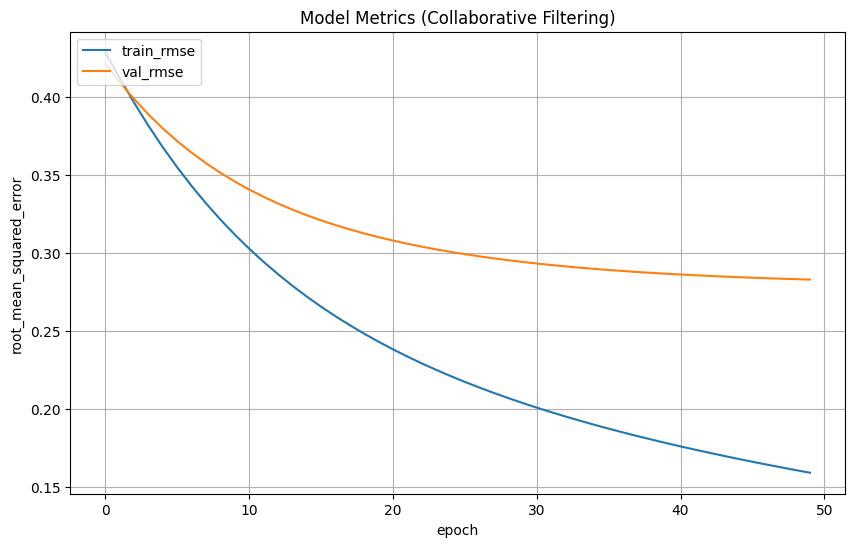

In [58]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['root_mean_squared_error'], label='train_rmse')
plt.plot(history.history['val_root_mean_squared_error'], label='val_rmse')
plt.title('Model Metrics (Collaborative Filtering)')
plt.ylabel('root_mean_squared_error')
plt.xlabel('epoch')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

Grafik menunjukkan performa training model collaborative filtering yang baik, di mana baik training RMSE (biru) maupun validation RMSE (oranye) mengalami penurunan konsisten dari epoch 0 hingga 50, menandakan model berhasil belajar pola dalam data. Gap yang relatif kecil antara training dan validation error (sekitar 0.12 perbedaan di akhir training) mengindikasikan model tidak mengalami overfitting yang signifikan, sehingga memiliki kemampuan generalisasi yang baik untuk memberikan prediksi rating yang akurat pada data baru.